In [1]:
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import transforms
from torchvision.ops import DeformConv2d
from torchmetrics.functional import peak_signal_noise_ratio, structural_similarity_index_measure
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import os
from skimage.feature import canny
import tqdm
from sklearn.model_selection import train_test_split
from torchsummary import summary

In [2]:
print("All imports successful!")
print("PyTorch:", torch.__version__)
print("Torchvision:", torchvision.__version__)
print("CUDA:", torch.cuda.is_available())


All imports successful!
PyTorch: 1.12.1+cu113
Torchvision: 0.13.1+cu113
CUDA: True


In [3]:
def get_edge_map(image):
    image = image.detach()
    is_batched = len(image.shape) == 4
    
    if is_batched:
        batch_size = image.shape[0]
        edge_maps = []
        for i in range(batch_size):
            img_np = image[i].cpu().numpy().transpose(1, 2, 0)  # Move to CPU for canny
            img_np = (img_np + 1) / 2
            edges = canny(img_np.mean(axis=2), sigma=2)
            edge_maps.append(torch.tensor(edges, dtype=torch.float32).to(image.device))
        return torch.stack(edge_maps, dim=0).unsqueeze(1)
    else:
        img_np = image.cpu().numpy().transpose(1, 2, 0)
        img_np = (img_np + 1) / 2
        edges = canny(img_np.mean(axis=2), sigma=2)
        return torch.tensor(edges, dtype=torch.float32).unsqueeze(0).to(image.device)

In [4]:
class EnhancedGenerator(nn.Module):
    def __init__(self):
        super().__init__()
        # Encoder: Downsample to 64x64
        self.enc1 = nn.Conv2d(4, 64, 4, 2, 1)  # 256x256 -> 128x128
        self.enc2 = DeformableBlock(64, 128)    # 128x128
        self.enc3 = nn.Conv2d(128, 256, 4, 2, 1)  # 128x128 -> 64x64
        
        # Residual blocks at bottleneck
        self.res_blocks = nn.ModuleList([ResidualBlock(256) for _ in range(6)])
        self.attn = AttentionModule(256)
        
        # Decoder: Upsample back to 256x256
        self.dec3 = nn.ConvTranspose2d(256, 128, 4, 2, 1)  # 64x64 -> 128x128
        self.dec2 = DeformableBlock(128, 64)               # 128x128
        self.dec1 = nn.ConvTranspose2d(64, 3, 4, 2, 1)    # 128x128 -> 256x256
        
        self.tanh = nn.Tanh()
    
    def forward(self, x):
        e1 = F.leaky_relu(self.enc1(x), 0.2)
        e2 = self.enc2(e1)
        e3 = F.leaky_relu(self.enc3(e2), 0.2)
        
        r = e3
        for block in self.res_blocks:
            r = block(r)
        r = self.attn(r)
        
        d3 = F.leaky_relu(self.dec3(r), 0.2)
        d2 = self.dec2(d3)
        d1 = self.dec1(d2)
        
        return self.tanh(d1)



In [5]:
class DeformableBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.offset_conv = nn.Conv2d(in_channels, 2 * 3 * 3, 3, padding=1)
        self.deform_conv = DeformConv2d(in_channels, out_channels, 3, padding=1)
        self.norm = nn.GroupNorm(16, out_channels)
        self.relu = nn.LeakyReLU(0.2, inplace=True)
    
    def forward(self, x):
        offset = self.offset_conv(x)
        x = self.deform_conv(x, offset)
        x = self.norm(x)
        x = self.relu(x)
        return x



In [6]:
#4: Multi-Scale Discriminator
class MultiScaleDiscriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.scale1 = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1), nn.GroupNorm(16, 128), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, 4, 1, 0), nn.Sigmoid()
        )
        self.scale2 = nn.Sequential(
            nn.AvgPool2d(2),
            nn.Conv2d(3, 64, 4, 2, 1), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1), nn.GroupNorm(16, 128), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 1, 4, 1, 0), nn.Sigmoid()
        )
    
    def forward(self, x):
        return [self.scale1(x), self.scale2(x)]



In [7]:
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.conv1 = nn.Conv2d(channels, channels, 3, padding=1)
        self.norm1 = nn.GroupNorm(16, channels)
        self.conv2 = nn.Conv2d(channels, channels, 3, padding=1)
        self.norm2 = nn.GroupNorm(16, channels)
    
    def forward(self, x):
        residual = x
        x = F.leaky_relu(self.norm1(self.conv1(x)), 0.2)
        x = self.norm2(self.conv2(x))
        return x + residual

class AttentionModule(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.conv = nn.Conv2d(channels, channels, 1)
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        attn = self.sigmoid(self.conv(x))
        return x * attn



In [8]:
#5: Loss Functions
def compute_content_loss(fake, real):
    return F.l1_loss(fake, real)

def compute_adversarial_loss(discriminator, fake, real):
    real_out = discriminator(real)
    fake_out = discriminator(fake)
    loss = 0
    for ro, fo in zip(real_out, fake_out):
        loss += nn.BCELoss()(ro, torch.ones_like(ro)) + nn.BCELoss()(fo, torch.zeros_like(fo))
    return loss / 2

def compute_perceptual_loss(fake, real):
    return F.mse_loss(fake, real)  # Simplified; use VGG if desired

def compute_edge_loss(fake, real):
    fake_edges = get_edge_map(fake)
    real_edges = get_edge_map(real)
    return F.l1_loss(fake_edges, real_edges)

def compute_total_loss(generator, discriminator, fake, real):
    c_loss = compute_content_loss(fake, real)
    a_loss = compute_adversarial_loss(discriminator, fake, real)
    p_loss = compute_perceptual_loss(fake, real)
    e_loss = compute_edge_loss(fake, real)
    lambda1, lambda2, lambda3, lambda4 = 1.0, 3.0, 0.01, 0.1
    total_loss = (lambda1 * c_loss + lambda2 * a_loss + lambda3 * p_loss + lambda4 * e_loss)
    return total_loss, c_loss, a_loss, p_loss, e_loss



In [9]:

import torch
import torch.nn.functional as F

def compute_iou(pred_edges, true_edges):
    """Compute Intersection over Union (IoU) for edge maps."""
    pred_edges = (pred_edges > 0.5).float()  # Threshold to binary
    true_edges = (true_edges > 0.5).float()
    intersection = (pred_edges * true_edges).sum(dim=[1, 2])
    union = (pred_edges + true_edges).clamp(0, 1).sum(dim=[1, 2])
    return intersection / (union + 1e-6)  # Add epsilon to avoid division by zero

def compute_f1_score(pred_edges, true_edges):
    """Compute F1-score for edge maps."""
    pred_edges = (pred_edges > 0.5).float()
    true_edges = (true_edges > 0.5).float()
    tp = (pred_edges * true_edges).sum(dim=[1, 2])
    fp = (pred_edges * (1 - true_edges)).sum(dim=[1, 2])
    fn = ((1 - pred_edges) * true_edges).sum(dim=[1, 2])
    precision = tp / (tp + fp + 1e-6)
    recall = tp / (tp + fn + 1e-6)
    return 2 * (precision * recall) / (precision + recall + 1e-6)

In [10]:
#6: Dataset
class EUVPDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.distorted_images = []
        self.gt_images = []
        for subdir in os.listdir(root_dir):
            trainA_dir = os.path.join(root_dir, subdir, 'trainA')
            trainB_dir = os.path.join(root_dir, subdir, 'trainB')
            if os.path.isdir(trainA_dir) and os.path.isdir(trainB_dir):
                trainA_files = sorted(os.listdir(trainA_dir))
                trainB_files = sorted(os.listdir(trainB_dir))
                assert len(trainA_files) == len(trainB_files), f"Mismatch in {subdir}"
                self.distorted_images.extend(os.path.join(trainA_dir, f) for f in trainA_files)
                self.gt_images.extend(os.path.join(trainB_dir, f) for f in trainB_files)
        assert len(self.distorted_images) == len(self.gt_images), "Total mismatch"
        print(f"Total images loaded: {len(self.distorted_images)}")
    
    def __len__(self):
        return len(self.distorted_images)
    
    def __getitem__(self, idx):
        distorted = Image.open(self.distorted_images[idx]).convert('RGB')
        gt = Image.open(self.gt_images[idx]).convert('RGB')
        if self.transform:
            distorted = self.transform(distorted)
            gt = self.transform(gt)
        edge_map = get_edge_map(distorted).to(distorted.device)
        distorted = torch.cat([distorted, edge_map], dim=0)  # [4, 256, 256]
        return distorted, gt

transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

dataset = EUVPDataset(
    r'C:\Users\plawa\anaconda3\envs\underwater_gan_new\EUVP\Paired',
    transform=transform
)
train_loader = DataLoader(dataset, batch_size=4, shuffle=True)


Total images loaded: 11435


In [11]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

full_dataset = EUVPDataset(
    r'C:\Users\plawa\anaconda3\envs\underwater_gan_new\EUVP\Paired',
    transform=transform
)

# Split indices
indices = list(range(len(full_dataset)))
train_indices, test_indices = train_test_split(indices, test_size=0.2, random_state=42)

# Create subsets
train_dataset = Subset(full_dataset, train_indices)
test_dataset = Subset(full_dataset, test_indices)

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False)

print(f"Training samples: {len(train_dataset)}, Test samples: {len(test_dataset)}")



Total images loaded: 11435
Training samples: 9148, Test samples: 2287


In [12]:
import torch
import torch.optim as optim
from torch.utils.data import DataLoader
from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generator = EnhancedGenerator().to(device)
discriminator = MultiScaleDiscriminator().to(device)

g_optimizer = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.00002, betas=(0.5, 0.999))



In [71]:
import csv
from datetime import datetime
import os

# Create CSV file and write header
def init_csv_logger(filename='training_log.csv'):
    if not os.path.exists(filename):
        with open(filename, 'w', newline='') as f:
            writer = csv.writer(f)
            writer.writerow([
                'timestamp', 'epoch', 
                'train_g_loss', 'train_d_loss', 
                'test_psnr', 'test_ssim',
                'best_psnr'
            ])

# Function to append data to CSV
def log_epoch_data(filename, data):
    with open(filename, 'a', newline='') as f:
        writer = csv.writer(f)
        writer.writerow(data)

# Initialize CSV logger
log_file = 'training_log.csv'
init_csv_logger(log_file)

num_epochs = 100
best_psnr = 0
history = {'train': [], 'test': []}

for epoch in range(num_epochs):
    # Training phase
    generator.train()
    discriminator.train()
    epoch_g_loss, epoch_d_loss = 0, 0
    
    train_loader_tqdm = tqdm(train_loader, desc=f"Train Epoch [{epoch+1}/{num_epochs}]")
    
    for i, (distorted, ground_truth) in enumerate(train_loader_tqdm):
        distorted, ground_truth = distorted.to(device), ground_truth.to(device)
        
        # Train Discriminator (every 25 batches)
        if i % 25 == 0:
            d_optimizer.zero_grad()
            with torch.no_grad():
                fake = generator(distorted)
            real_noise = ground_truth + torch.randn_like(ground_truth) * 0.1
            fake_noise = fake.detach() + torch.randn_like(fake) * 0.1
            d_loss = compute_adversarial_loss(discriminator, fake_noise, real_noise)
            d_loss.backward()
            torch.nn.utils.clip_grad_norm_(discriminator.parameters(), max_norm=1.0)
            d_optimizer.step()
            epoch_d_loss += d_loss.item()
        
        # Train Generator (every batch)
        g_optimizer.zero_grad()
        fake = generator(distorted)
        g_loss, c_loss, a_loss, p_loss, e_loss = compute_total_loss(generator, discriminator, fake, ground_truth)
        g_loss.backward()
        torch.nn.utils.clip_grad_norm_(generator.parameters(), max_norm=1.0)
        g_optimizer.step()
        epoch_g_loss += g_loss.item()
        
        # Log metrics (every 10 batches)
        if i % 10 == 0:
            with torch.no_grad():
                psnr = peak_signal_noise_ratio(fake, ground_truth, data_range=2.0).item()
                ssim = structural_similarity_index_measure(fake, ground_truth, data_range=2.0).item()
            train_loader_tqdm.set_postfix({
                'D Loss': f'{d_loss.item():.4f}',
                'G Loss': f'{g_loss.item():.4f}',
                'PSNR': f'{psnr:.2f}',
                'SSIM': f'{ssim:.4f}'
            })
    
    # Evaluation phase
    generator.eval()
    discriminator.eval()
    test_psnr, test_ssim = [], []
    
    with torch.no_grad():
        for distorted, ground_truth in test_loader:
            distorted, ground_truth = distorted.to(device), ground_truth.to(device)
            fake = generator(distorted)
            
            test_psnr.append(peak_signal_noise_ratio(fake, ground_truth, data_range=2.0).item())
            test_ssim.append(structural_similarity_index_measure(fake, ground_truth, data_range=2.0).item())
    
    mean_psnr = np.mean(test_psnr)
    mean_ssim = np.mean(test_ssim)
    
    # Save best model
    if mean_psnr > best_psnr:
        best_psnr = mean_psnr
        torch.save(generator.state_dict(), "generator_best.pth")
        torch.save(discriminator.state_dict(), "discriminator_best.pth")
    
    # Log epoch data to CSV
    log_data = [
        datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
        epoch + 1,
        epoch_g_loss / len(train_loader),
        epoch_d_loss / max(1, len(train_loader) // 25),
        mean_psnr,
        mean_ssim,
        best_psnr
    ]
    log_epoch_data(log_file, log_data)  # Save metrics for this epoch
    
    print(f"Epoch {epoch+1}: Test PSNR: {mean_psnr:.2f}, SSIM: {mean_ssim:.4f}")



In [ ]:
# ========== 9. Visualization ==========
def visualize_results(loader, num_samples=5, save_path="results.png"):
    # Load best generator
    generator.load_state_dict(torch.load("generator_best.pth"))
    generator.eval()
    
    # Get sample batch
    distorted, ground_truth = next(iter(loader))
    distorted, ground_truth = distorted.to(device), ground_truth.to(device)
    
    with torch.no_grad():
        fake = generator(distorted)
    
    # Prepare plots
    fig, axs = plt.subplots(num_samples, 4, figsize=(15, 4*num_samples))
    if num_samples == 1:
        axs = axs.reshape(1, -1)
    
    for i in range(num_samples):
        # Process images
        distorted_np = distorted[i, :3].cpu().numpy().transpose(1, 2, 0)
        edge_np = distorted[i, 3].cpu().numpy()
        fake_np = fake[i].cpu().numpy().transpose(1, 2, 0)
        gt_np = ground_truth[i].cpu().numpy().transpose(1, 2, 0)
        
        # Denormalize [-1,1] -> [0,1]
        distorted_np = (distorted_np + 1) / 2
        fake_np = (fake_np + 1) / 2
        gt_np = (gt_np + 1) / 2
        
        # Plot
        axs[i,0].imshow(distorted_np)
        axs[i,0].set_title("Distorted Input")
        axs[i,1].imshow(edge_np, cmap='gray')
        axs[i,1].set_title("Edge Map")
        axs[i,2].imshow(fake_np)
        axs[i,2].set_title("Generated Output")
        axs[i,3].imshow(gt_np)
        axs[i,3].set_title("Ground Truth")
        
        for ax in axs[i]:
            ax.axis('off')
    
    plt.tight_layout()
    plt.savefig(save_path, dpi=600, bbox_inches='tight')


# Visualize test results
visualize_results(test_loader, num_samples=3, save_path="test_results.png")



In [ ]:
import torch
import random
import matplotlib.pyplot as plt
import numpy as np

def visualize_results(loader, num_samples=4, save_path="test_results.png"):
    # Load best generator
    generator.load_state_dict(torch.load("generator_best.pth"))
    generator.eval()

    # Collect all samples from the loader
    all_distorted = []
    all_ground_truth = []
    for distorted, ground_truth in loader:
        all_distorted.append(distorted)
        all_ground_truth.append(ground_truth)
    all_distorted = torch.cat(all_distorted, dim=0)
    all_ground_truth = torch.cat(all_ground_truth, dim=0)

    # Pick random indices
    total_samples = all_distorted.size(0)
    indices = random.sample(range(total_samples), num_samples)

    # Initialize storage for further operations
    distorted_images = []
    edge_maps = []
    generated_images = []
    ground_truth_images = []

    # Prepare plot
    fig, axs = plt.subplots(num_samples, 4, figsize=(15, 4 * num_samples))

    if num_samples == 1:
        axs = axs.reshape(1, -1)

    for i, idx in enumerate(indices):
        distorted = all_distorted[idx].unsqueeze(0).to(device)
        ground_truth = all_ground_truth[idx].unsqueeze(0).to(device)

        with torch.no_grad():
            fake = generator(distorted)

        # Process for visualization
        distorted_np = distorted[0, :3].cpu().numpy().transpose(1, 2, 0)
        edge_np = distorted[0, 3].cpu().numpy()
        fake_np = fake[0].cpu().numpy().transpose(1, 2, 0)
        gt_np = ground_truth[0].cpu().numpy().transpose(1, 2, 0)

        # Denormalize [-1,1] -> [0,1]
        distorted_np = (distorted_np + 1) / 2
        fake_np = (fake_np + 1) / 2
        gt_np = (gt_np + 1) / 2

        # Save for further use
        distorted_images.append(distorted_np)
        edge_maps.append(edge_np)
        generated_images.append(fake_np)
        ground_truth_images.append(gt_np)

        # Plot
        axs[i, 0].imshow(distorted_np)
        axs[0, 0].set_title("Distorted Input")
        axs[i, 1].imshow(edge_np, cmap='gray')
        axs[0, 1].set_title("Edge Map")
        axs[i, 2].imshow(fake_np)
        axs[0, 2].set_title("Generated Output")
        axs[i, 3].imshow(gt_np)
        axs[0, 3].set_title("Ground Truth")

        for ax in axs[i]:
            ax.axis("off")

    plt.tight_layout()
    plt.savefig(save_path, dpi=1200, bbox_inches="tight")
    plt.show()

    # Return the data for further operations
    return {
        "distorted": distorted_images,
        "edges": edge_maps,
        "generated": generated_images,
        "ground_truth": ground_truth_images
    }

# Example Usage:
results = visualize_results(test_loader, num_samples=10, save_path="test_results.png")


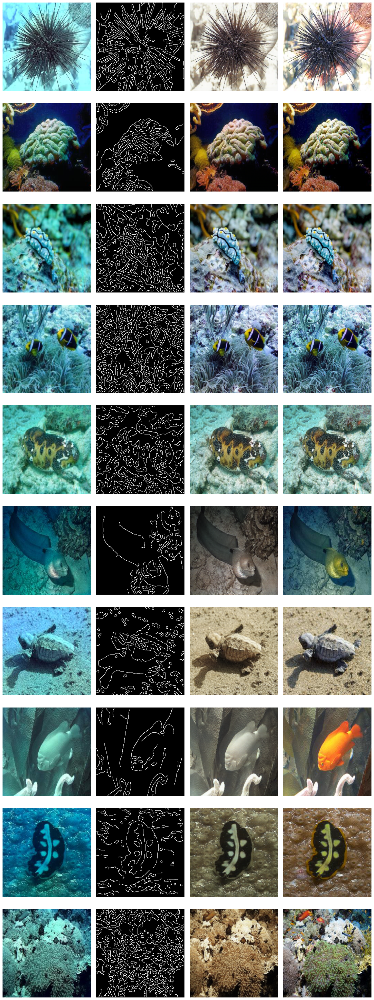

In [25]:
import torch
import random
import matplotlib.pyplot as plt
import numpy as np

def visualize_results(loader, num_samples=4, save_path="test_results.png"):
    # Load best generator
    generator.load_state_dict(torch.load("generator_best.pth"))
    generator.eval()

    # Collect all samples from the loader
    all_distorted = []
    all_ground_truth = []
    for distorted, ground_truth in loader:
        all_distorted.append(distorted)
        all_ground_truth.append(ground_truth)
    all_distorted = torch.cat(all_distorted, dim=0)
    all_ground_truth = torch.cat(all_ground_truth, dim=0)

    # Pick random indices
    total_samples = all_distorted.size(0)
    indices = random.sample(range(total_samples), num_samples)

    # Prepare plot
    fig, axs = plt.subplots(num_samples, 4, figsize=(15, 4 * num_samples))

    if num_samples == 1:
        axs = axs.reshape(1, -1)

    for i, idx in enumerate(indices):
        distorted = all_distorted[idx].unsqueeze(0).to(device)
        ground_truth = all_ground_truth[idx].unsqueeze(0).to(device)

        with torch.no_grad():
            fake = generator(distorted)

        # Process for visualization
        distorted_np = distorted[0, :3].cpu().numpy().transpose(1, 2, 0)
        edge_np = distorted[0, 3].cpu().numpy()
        fake_np = fake[0].cpu().numpy().transpose(1, 2, 0)
        gt_np = ground_truth[0].cpu().numpy().transpose(1, 2, 0)

        # Denormalize [-1,1] -> [0,1]
        distorted_np = (distorted_np + 1) / 2
        fake_np = (fake_np + 1) / 2
        gt_np = (gt_np + 1) / 2

        # Plot without labels
        axs[i, 0].imshow(distorted_np)
        axs[i, 1].imshow(edge_np, cmap='gray')
        axs[i, 2].imshow(fake_np)
        axs[i, 3].imshow(gt_np)

        for ax in axs[i]:
            ax.axis("off")

    plt.tight_layout()
    plt.savefig(save_path, dpi=1200, bbox_inches="tight")
    plt.show()

    return {
        "distorted": all_distorted,
        "ground_truth": all_ground_truth
    }

# Example Usage
results = visualize_results(test_loader, num_samples=10, save_path="test_results.png")


In [56]:
# Load best model
generator.load_state_dict(torch.load("generator_best.pth"))
generator.eval()

# Quantitative evaluation
psnr_list, ssim_list = [], []
with torch.no_grad():
    for distorted, ground_truth in test_loader:
        distorted, ground_truth = distorted.to(device), ground_truth.to(device)
        fake = generator(distorted)
        psnr_list.append(peak_signal_noise_ratio(fake, ground_truth, data_range=2.0).item())
        ssim_list.append(structural_similarity_index_measure(fake, ground_truth, data_range=2.0).item())

print(f"\nFinal Test Results:")
print(f"PSNR: {np.mean(psnr_list):.2f} ± {np.std(psnr_list):.2f}")
print(f"SSIM: {np.mean(ssim_list):.4f} ± {np.std(ssim_list):.4f}")




Final Test Results:
PSNR: 22.85 ± 2.34
SSIM: 0.7346 ± 0.0529


--- Edge Detection Metrics ---
Total Pixels: 65536
True Positives (TP): 2772 (0.0423%)
False Negatives (FN): 852 (0.0130%)
False Positives (FP): 493 (0.0075%)
True Negatives (TN): 61419 (0.9372%)

--- Derived Evaluation Metrics ---
Precision: 0.8490
Recall: 0.7649
F1-Score: 0.8048
Accuracy: 0.9795
Jaccard Index (IoU): 0.6733


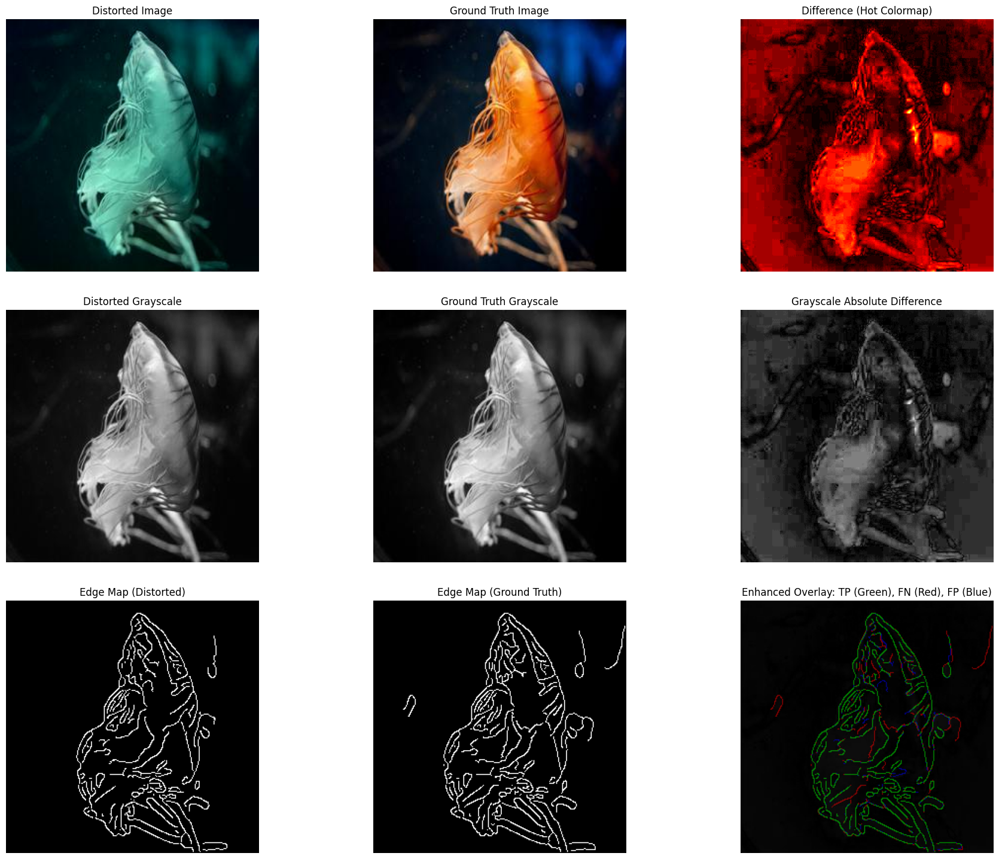

In [17]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
from skimage.feature import canny
from scipy.ndimage import binary_erosion, binary_dilation

# --- Edge Map Function ---
def get_edge_map(image, sigma=2):
    image = image.detach().cpu()
    is_batched = len(image.shape) == 4

    if is_batched:
        batch_size = image.shape[0]
        edge_maps = []
        for i in range(batch_size):
            img_np = image[i].numpy().transpose(1, 2, 0)
            img_np = (img_np + 1) / 2 # Normalize to [0, 1]
            edges = canny(img_np.mean(axis=2), sigma=sigma)
            edge_maps.append(torch.tensor(edges, dtype=torch.float32))
        return torch.stack(edge_maps, dim=0).unsqueeze(1).to(image.device)
    else:
        img_np = image.numpy().transpose(1, 2, 0)
        img_np = (img_np + 1) / 2 # Normalize to [0, 1]
        edges = canny(img_np.mean(axis=2), sigma=sigma)
        return torch.tensor(edges, dtype=torch.float32).unsqueeze(0)

# --- Load distorted and ground truth images ---
distorted_path = r'C:\Users\plawa\anaconda3\envs\underwater_gan_new\EUVP\Paired\underwater_dark\trainA\264452_00024486.jpg'
ground_truth_path = r'C:\Users\plawa\anaconda3\envs\underwater_gan_new\EUVP\Paired\underwater_dark\trainB\264452_00024486.jpg'

distorted = cv2.imread(distorted_path)
ground_truth = cv2.imread(ground_truth_path)

if distorted is None:
    print(f"Error: Could not load distorted image from {distorted_path}")
    exit()
if ground_truth is None:
    print(f"Error: Could not load ground truth image from {ground_truth_path}")
    exit()

# Resize ground truth if shapes mismatch
if distorted.shape != ground_truth.shape:
    ground_truth = cv2.resize(ground_truth, (distorted.shape[1], distorted.shape[0]))

# Grayscale conversions
distorted_gray = cv2.cvtColor(distorted, cv2.COLOR_BGR2GRAY)
ground_truth_gray = cv2.cvtColor(ground_truth, cv2.COLOR_BGR2GRAY)

# Grayscale absolute difference
diff = cv2.absdiff(distorted_gray, ground_truth_gray)

# --- Edge map from distorted image ---
distorted_tensor = torch.from_numpy(distorted.transpose(2, 0, 1)).float() / 127.5 - 1
edge_map_distorted_tensor = get_edge_map(distorted_tensor, sigma=1.5)
edge_map_distorted = edge_map_distorted_tensor.squeeze().numpy().astype(bool)

# --- Edge map from ground truth image ---
ground_truth_tensor = torch.from_numpy(ground_truth.transpose(2, 0, 1)).float() / 127.5 - 1
edge_map_gt_tensor = get_edge_map(ground_truth_tensor, sigma=1.5)
edge_map_gt = edge_map_gt_tensor.squeeze().numpy().astype(bool)

# --- Calculate True Positives, False Negatives, False Positives ---
tp_mask = edge_map_distorted & edge_map_gt
fn_mask = edge_map_gt & (~edge_map_distorted)
fp_mask = edge_map_distorted & (~edge_map_gt)
tn_mask = (~edge_map_distorted) & (~edge_map_gt) # True Negatives

# Count the pixels for each category
TP = np.sum(tp_mask)
FN = np.sum(fn_mask)
FP = np.sum(fp_mask)
TN = np.sum(tn_mask)

# Total pixels for reference
total_pixels = edge_map_distorted.size # Or edge_map_gt.size, they should be the same

print(f"--- Edge Detection Metrics ---")
print(f"Total Pixels: {total_pixels}")
print(f"True Positives (TP): {TP} ({TP/total_pixels:.4f}%)")
print(f"False Negatives (FN): {FN} ({FN/total_pixels:.4f}%)")
print(f"False Positives (FP): {FP} ({FP/total_pixels:.4f}%)")
print(f"True Negatives (TN): {TN} ({TN/total_pixels:.4f}%)")

# Calculate Derived Metrics
precision = TP / (TP + FP) if (TP + FP) > 0 else 0
recall = TP / (TP + FN) if (TP + FN) > 0 else 0
f1_score = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
accuracy = (TP + TN) / total_pixels
jaccard_index = TP / (TP + FP + FN) if (TP + FP + FN) > 0 else 0


print(f"\n--- Derived Evaluation Metrics ---")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score: {f1_score:.4f}")
print(f"Accuracy: {accuracy:.4f}")
print(f"Jaccard Index (IoU): {jaccard_index:.4f}")


# --- Create colored overlay for visualization ---
overlay_enhanced = cv2.cvtColor(diff, cv2.COLOR_GRAY2RGB).astype(np.float32) / 255.0

color_tp = np.array([0, 1, 0])   # Green for True Positives
color_fn = np.array([1, 0, 0])   # Red for False Negatives (missing edges)
color_fp = np.array([0, 0, 1])   # Blue for False Positives (spurious edges)
alpha = 0.5 # Transparency level for overlays

overlay_enhanced[tp_mask] = (1 - alpha) * overlay_enhanced[tp_mask] + alpha * color_tp
overlay_enhanced[fn_mask] = (1 - alpha) * overlay_enhanced[fn_mask] + alpha * color_fn
overlay_enhanced[fp_mask] = (1 - alpha) * overlay_enhanced[fp_mask] + alpha * color_fp

overlay_enhanced = np.clip(overlay_enhanced * 255, 0, 255).astype(np.uint8)

# --- Plotting All Images with Enhanced Overlay ---
plt.figure(figsize=(20, 15))

titles = [
    "Distorted Image",
    "Ground Truth Image",
    "Difference (Hot Colormap)",
    "Distorted Grayscale",
    "Ground Truth Grayscale",
    "Grayscale Absolute Difference",
    "Edge Map (Distorted)",
    "Edge Map (Ground Truth)",
    "Enhanced Overlay: TP (Green), FN (Red), FP (Blue)"
]

plt.subplot(3, 3, 1)
plt.title(titles[0], fontsize=12)
plt.imshow(cv2.cvtColor(distorted, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(3, 3, 2)
plt.title(titles[1], fontsize=12)
plt.imshow(cv2.cvtColor(ground_truth, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(3, 3, 3)
plt.title(titles[2], fontsize=12)
plt.imshow(diff, cmap='hot')
plt.axis('off')

plt.subplot(3, 3, 4)
plt.title(titles[3], fontsize=12)
plt.imshow(distorted_gray, cmap='gray')
plt.axis('off')

plt.subplot(3, 3, 5)
plt.title(titles[4], fontsize=12)
plt.imshow(ground_truth_gray, cmap='gray')
plt.axis('off')

plt.subplot(3, 3, 6)
plt.title(titles[5], fontsize=12)
plt.imshow(diff, cmap='gray')
plt.axis('off')

plt.subplot(3, 3, 7)
plt.title(titles[6], fontsize=12)
plt.imshow(edge_map_distorted, cmap='gray')
plt.axis('off')

plt.subplot(3, 3, 8)
plt.title(titles[7], fontsize=12)
plt.imshow(edge_map_gt, cmap='gray')
plt.axis('off')

plt.subplot(3, 3, 9)
plt.title(titles[8], fontsize=12)
plt.imshow(overlay_enhanced)
plt.axis('off')

plt.tight_layout(pad=3.0)
plt.savefig("research_paper_visualization_with_edge_analysis_and_metrics.png", dpi=300, bbox_inches='tight')
plt.show()
plt.close()



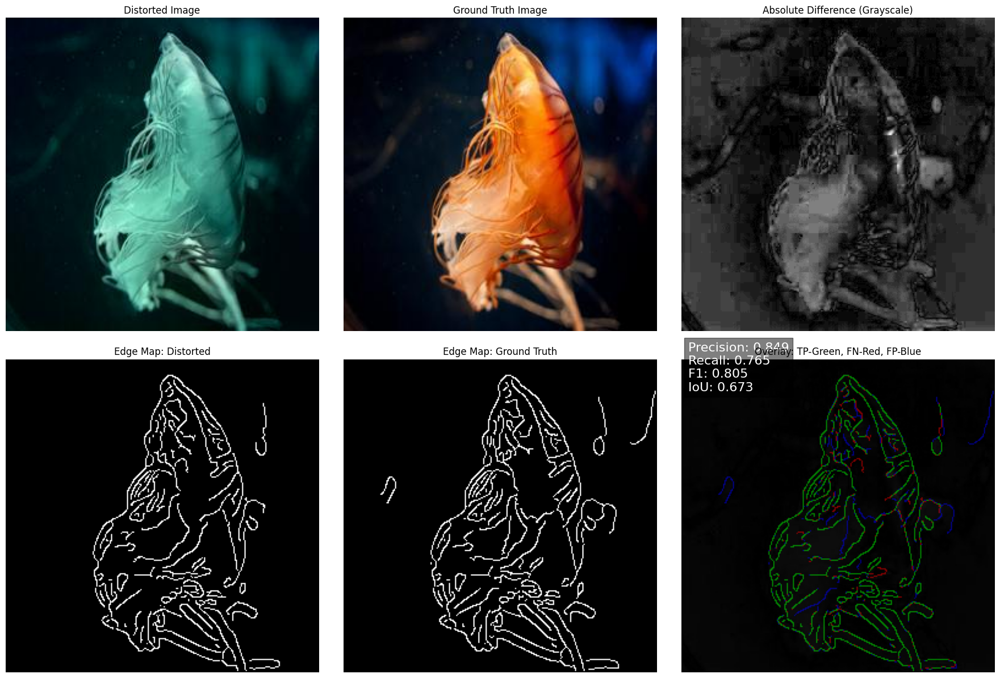

In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
from skimage.feature import canny

# ---------------- Edge Map Function ----------------
def get_edge_map(image, sigma=2):
    image = image.detach().cpu()
    is_batched = len(image.shape) == 4

    if is_batched:
        edge_maps = []
        for i in range(image.shape[0]):
            img_np = image[i].numpy().transpose(1,2,0)
            img_np = (img_np + 1) / 2
            edges = canny(img_np.mean(axis=2), sigma=sigma)
            edge_maps.append(torch.tensor(edges, dtype=torch.float32))
        return torch.stack(edge_maps, dim=0).unsqueeze(1)
    else:
        img_np = image.numpy().transpose(1,2,0)
        img_np = (img_np + 1) / 2
        edges = canny(img_np.mean(axis=2), sigma=sigma)
        return torch.tensor(edges, dtype=torch.float32).unsqueeze(0)

# ---------------- Load Images ----------------
distorted_path = r'C:\Users\plawa\anaconda3\envs\underwater_gan_new\EUVP\Paired\underwater_dark\trainA\264452_00024486.jpg'
ground_truth_path = r'C:\Users\plawa\anaconda3\envs\underwater_gan_new\EUVP\Paired\underwater_dark\trainB\264452_00024486.jpg'


distorted = cv2.imread(distorted_path)
ground_truth = cv2.imread(ground_truth_path)

if distorted is None or ground_truth is None:
    raise FileNotFoundError("Check your file paths; images not loaded.")

# Resize GT if mismatch
if distorted.shape != ground_truth.shape:
    ground_truth = cv2.resize(ground_truth, (distorted.shape[1], distorted.shape[0]))

# ---------------- Preprocess ----------------
distorted_gray = cv2.cvtColor(distorted, cv2.COLOR_BGR2GRAY)
ground_truth_gray = cv2.cvtColor(ground_truth, cv2.COLOR_BGR2GRAY)
diff_gray = cv2.absdiff(distorted_gray, ground_truth_gray)

# ---------------- Edge Maps ----------------
distorted_tensor = torch.from_numpy(distorted.transpose(2,0,1)).float()/127.5 - 1
ground_truth_tensor = torch.from_numpy(ground_truth.transpose(2,0,1)).float()/127.5 - 1

edge_distorted = get_edge_map(distorted_tensor, sigma=1.5).squeeze().numpy().astype(bool)
edge_gt = get_edge_map(ground_truth_tensor, sigma=1.5).squeeze().numpy().astype(bool)

# ---------------- Edge Metrics ----------------
tp = np.sum(edge_distorted & edge_gt)
fn = np.sum(edge_gt & (~edge_distorted))
fp = np.sum(edge_distorted & (~edge_gt))
tn = np.sum(~edge_distorted & ~edge_gt)
total = edge_distorted.size

precision = tp / (tp + fp) if tp + fp > 0 else 0
recall = tp / (tp + fn) if tp + fn > 0 else 0
f1 = 2 * precision * recall / (precision + recall) if precision + recall > 0 else 0
accuracy = (tp + tn) / total
iou = tp / (tp + fp + fn) if tp + fp + fn > 0 else 0

# ---------------- Overlay Visualization ----------------
overlay = cv2.cvtColor(diff_gray, cv2.COLOR_GRAY2RGB).astype(np.float32)/255.0
alpha = 0.5
overlay[edge_distorted & edge_gt] = (1-alpha)*overlay[edge_distorted & edge_gt] + alpha*np.array([0,1,0]) # TP: Green
overlay[edge_gt & (~edge_distorted)] = (1-alpha)*overlay[edge_gt & (~edge_distorted)] + alpha*np.array([1,0,0]) # FN: Red
overlay[edge_distorted & (~edge_gt)] = (1-alpha)*overlay[edge_distorted & (~edge_gt)] + alpha*np.array([0,0,1]) # FP: Blue
overlay = np.clip(overlay*255,0,255).astype(np.uint8)

# ---------------- Plot ----------------
plt.figure(figsize=(18,12))

images = [distorted, ground_truth, diff_gray, edge_distorted, edge_gt, overlay]
titles = [
    "Distorted Image",
    "Ground Truth Image",
    "Absolute Difference (Grayscale)",
    "Edge Map: Distorted",
    "Edge Map: Ground Truth",
    "Overlay: TP-Green, FN-Red, FP-Blue"
]

for i, (img, title) in enumerate(zip(images, titles), 1):
    plt.subplot(2,3,i)
    if img.ndim == 2:
        plt.imshow(img, cmap='gray')
    else:
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(title, fontsize=12)
    plt.axis('off')

    # Add metrics text to the overlay subplot
    if title.startswith("Overlay"):
        metrics_text = (
            f"Precision: {precision:.3f}\n"
            f"Recall: {recall:.3f}\n"
            f"F1: {f1:.3f}\n"
            f"IoU: {iou:.3f}"
        )
        plt.text(
            5, 25, metrics_text, color='white', fontsize=16,
            bbox=dict(facecolor='black', alpha=0.5, pad=5)
        )

plt.tight_layout()
plt.savefig("edge_analysis_paper_ready_with_metrics.png", dpi=300, bbox_inches='tight')
plt.show()



--- Image 1 (Index 6) ---
[Distorted vs Ground Truth]
TP: 4335, FN: 1294, FP: 581, TN: 59326
Precision: 0.8818, Recall: 0.7701, F1: 0.8222, Acc: 0.9714, IoU: 0.6981

[Generated vs Ground Truth]
TP: 4630, FN: 999, FP: 707, TN: 59200
Precision: 0.8675, Recall: 0.8225, F1: 0.8444, Acc: 0.9740, IoU: 0.7307


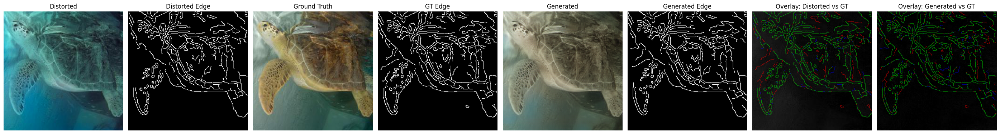


--- Image 2 (Index 7) ---
[Distorted vs Ground Truth]
TP: 8650, FN: 5708, FP: 2946, TN: 48232
Precision: 0.7459, Recall: 0.6025, F1: 0.6666, Acc: 0.8680, IoU: 0.4999

[Generated vs Ground Truth]
TP: 11529, FN: 2829, FP: 2775, TN: 48403
Precision: 0.8060, Recall: 0.8030, F1: 0.8045, Acc: 0.9145, IoU: 0.6729


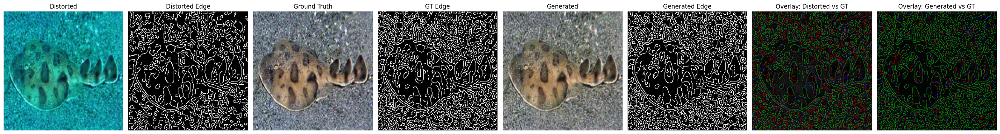


--- Image 3 (Index 9) ---
[Distorted vs Ground Truth]
TP: 729, FN: 92, FP: 56, TN: 64659
Precision: 0.9287, Recall: 0.8879, F1: 0.9078, Acc: 0.9977, IoU: 0.8312

[Generated vs Ground Truth]
TP: 694, FN: 127, FP: 103, TN: 64612
Precision: 0.8708, Recall: 0.8453, F1: 0.8578, Acc: 0.9965, IoU: 0.7511


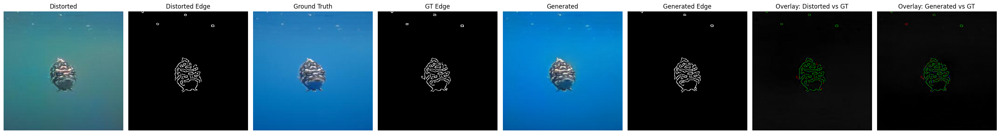


--- Image 4 (Index 5) ---
[Distorted vs Ground Truth]
TP: 4532, FN: 1613, FP: 1041, TN: 58350
Precision: 0.8132, Recall: 0.7375, F1: 0.7735, Acc: 0.9595, IoU: 0.6307

[Generated vs Ground Truth]
TP: 5120, FN: 1025, FP: 852, TN: 58539
Precision: 0.8573, Recall: 0.8332, F1: 0.8451, Acc: 0.9714, IoU: 0.7317


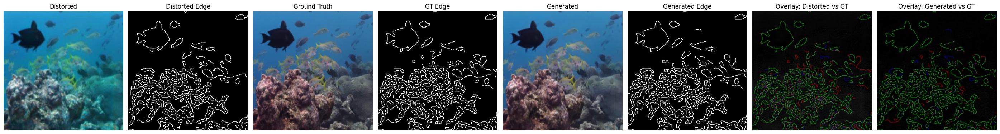


--- Image 5 (Index 3) ---
[Distorted vs Ground Truth]
TP: 6516, FN: 2794, FP: 3072, TN: 53154
Precision: 0.6796, Recall: 0.6999, F1: 0.6896, Acc: 0.9105, IoU: 0.5262

[Generated vs Ground Truth]
TP: 7707, FN: 1603, FP: 2486, TN: 53740
Precision: 0.7561, Recall: 0.8278, F1: 0.7903, Acc: 0.9376, IoU: 0.6534


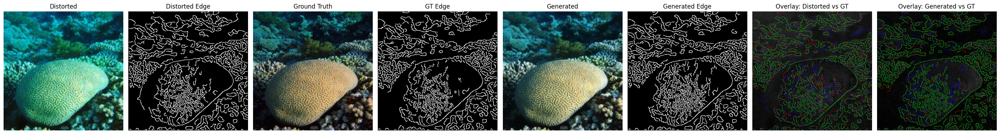

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import torch
from skimage.feature import canny
import os
import random
from scipy.ndimage import binary_erosion, binary_dilation

# --- Edge Map Function ---
def get_edge_map(image, sigma=2):
    image = image.detach().cpu()
    is_batched = len(image.shape) == 4

    if is_batched:
        edge_maps = []
        for i in range(image.shape[0]):
            img_np = image[i].numpy().transpose(1, 2, 0)
            img_np = (img_np + 1) / 2
            edges = canny(img_np.mean(axis=2), sigma=sigma)
            edge_maps.append(torch.tensor(edges, dtype=torch.float32))
        return torch.stack(edge_maps, dim=0).unsqueeze(1).to(image.device)
    else:
        img_np = image.numpy().transpose(1, 2, 0)
        img_np = (img_np + 1) / 2
        edges = canny(img_np.mean(axis=2), sigma=sigma)
        return torch.tensor(edges, dtype=torch.float32).unsqueeze(0)

# --- Create directory ---
os.makedirs("edge_analysis_results", exist_ok=True)

# --- Take 10 random image indices ---
num_images = len(results["distorted"])
random_indices = random.sample(range(num_images), 5)

for idx, real_idx in enumerate(random_indices):
    distorted_np = results["distorted"][real_idx]
    ground_truth_np = results["ground_truth"][real_idx]
    generated_np = results["generated"][real_idx]

    # Convert to tensors
    distorted_tensor = torch.from_numpy(distorted_np.transpose(2, 0, 1)).float() * 2 - 1
    ground_truth_tensor = torch.from_numpy(ground_truth_np.transpose(2, 0, 1)).float() * 2 - 1
    generated_tensor = torch.from_numpy(generated_np.transpose(2, 0, 1)).float() * 2 - 1

    # Get edge maps
    edge_map_gt = get_edge_map(ground_truth_tensor, sigma=1.5).squeeze().numpy().astype(bool)
    edge_map_pred = get_edge_map(generated_tensor, sigma=1.5).squeeze().numpy().astype(bool)
    edge_map_distorted = get_edge_map(distorted_tensor, sigma=1.5).squeeze().numpy().astype(bool)

    # --- Compute gray diff ---
    distorted_gray = cv2.cvtColor((distorted_np * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    ground_truth_gray = cv2.cvtColor((ground_truth_np * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    generated_gray = cv2.cvtColor((generated_np * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
    diff_gray_input = cv2.absdiff(distorted_gray, ground_truth_gray)
    diff_gray_gen = cv2.absdiff(generated_gray, ground_truth_gray)

    total_pixels = edge_map_gt.size

    # --- Metrics: distorted vs GT ---
    tp_d = edge_map_distorted & edge_map_gt
    fn_d = edge_map_gt & (~edge_map_distorted)
    fp_d = edge_map_distorted & (~edge_map_gt)
    tn_d = (~edge_map_distorted) & (~edge_map_gt)

    TP_d, FN_d, FP_d, TN_d = map(np.sum, [tp_d, fn_d, fp_d, tn_d])
    precision_d = TP_d / (TP_d + FP_d) if (TP_d + FP_d) > 0 else 0
    recall_d = TP_d / (TP_d + FN_d) if (TP_d + FN_d) > 0 else 0
    f1_score_d = (2 * precision_d * recall_d) / (precision_d + recall_d) if (precision_d + recall_d) > 0 else 0
    accuracy_d = (TP_d + TN_d) / total_pixels
    jaccard_d = TP_d / (TP_d + FP_d + FN_d) if (TP_d + FP_d + FN_d) > 0 else 0

    # --- Metrics: generated vs GT ---
    tp_g = edge_map_pred & edge_map_gt
    fn_g = edge_map_gt & (~edge_map_pred)
    fp_g = edge_map_pred & (~edge_map_gt)
    tn_g = (~edge_map_pred) & (~edge_map_gt)

    TP_g, FN_g, FP_g, TN_g = map(np.sum, [tp_g, fn_g, fp_g, tn_g])
    precision_g = TP_g / (TP_g + FP_g) if (TP_g + FP_g) > 0 else 0
    recall_g = TP_g / (TP_g + FN_g) if (TP_g + FN_g) > 0 else 0
    f1_score_g = (2 * precision_g * recall_g) / (precision_g + recall_g) if (precision_g + recall_g) > 0 else 0
    accuracy_g = (TP_g + TN_g) / total_pixels
    jaccard_g = TP_g / (TP_g + FP_g + FN_g) if (TP_g + FP_g + FN_g) > 0 else 0

    print(f"\n--- Image {idx + 1} (Index {real_idx}) ---")
    print("[Distorted vs Ground Truth]")
    print(f"TP: {TP_d}, FN: {FN_d}, FP: {FP_d}, TN: {TN_d}")
    print(f"Precision: {precision_d:.4f}, Recall: {recall_d:.4f}, F1: {f1_score_d:.4f}, Acc: {accuracy_d:.4f}, IoU: {jaccard_d:.4f}")

    print("\n[Generated vs Ground Truth]")
    print(f"TP: {TP_g}, FN: {FN_g}, FP: {FP_g}, TN: {TN_g}")
    print(f"Precision: {precision_g:.4f}, Recall: {recall_g:.4f}, F1: {f1_score_g:.4f}, Acc: {accuracy_g:.4f}, IoU: {jaccard_g:.4f}")

    # --- Overlay creation ---
    def create_overlay(diff_gray, tp_mask, fn_mask, fp_mask):
        overlay = cv2.cvtColor(diff_gray, cv2.COLOR_GRAY2RGB).astype(np.float32) / 255.0
        alpha = 0.5
        overlay[tp_mask] = (1 - alpha) * overlay[tp_mask] + alpha * np.array([0, 1, 0])   # Green
        overlay[fn_mask] = (1 - alpha) * overlay[fn_mask] + alpha * np.array([1, 0, 0])   # Red
        overlay[fp_mask] = (1 - alpha) * overlay[fp_mask] + alpha * np.array([0, 0, 1])   # Blue
        return np.clip(overlay * 255, 0, 255).astype(np.uint8)

    overlay_input = create_overlay(diff_gray_input, tp_d, fn_d, fp_d)
    overlay_generated = create_overlay(diff_gray_gen, tp_g, fn_g, fp_g)

    # --- Plot all in a row ---
    plt.figure(figsize=(28, 6))
    images = [
        (distorted_np, "Distorted"), (edge_map_distorted, "Distorted Edge"),
        (ground_truth_np, "Ground Truth"), (edge_map_gt, "GT Edge"),
        (generated_np, "Generated"), (edge_map_pred, "Generated Edge"),
        (overlay_input, "Overlay: Distorted vs GT"), (overlay_generated, "Overlay: Generated vs GT"),
    ]

    for i, (img, title) in enumerate(images):
        plt.subplot(1, len(images), i + 1)
        if img.ndim == 2:
            plt.imshow(img, cmap='gray')
        else:
            plt.imshow(img)
        plt.title(title)
        plt.axis('off')

    plt.tight_layout()
    save_name = f"edge_analysis_results/image_{idx+1:02d}_fullrow.png"
    plt.savefig(save_name, dpi=1200, bbox_inches='tight')
    plt.show()
    plt.close()


In [18]:
import torch
import numpy as np
from tqdm import tqdm

def compute_overall_edge_metrics(generator, test_loader, device, sigma=1.5):
    """
    Compute overall edge detection metrics for the test dataset.
    Args:
        generator: The trained generator model.
        test_loader: DataLoader for the test dataset.
        device: Device to run the computation (cuda or cpu).
        sigma: Sigma parameter for the Canny edge detector.
    Returns:
        dict: Metrics for Distorted vs GT and Generated vs GT.
    """
    generator.eval()
    total_pixels = 0
    metrics = {
        'distorted_vs_gt': {'TP': 0, 'FN': 0, 'FP': 0, 'TN': 0},
        'generated_vs_gt': {'TP': 0, 'FN': 0, 'FP': 0, 'TN': 0}
    }

    with torch.no_grad():
        for distorted, ground_truth in tqdm(test_loader, desc="Computing Edge Metrics"):
            distorted, ground_truth = distorted.to(device), ground_truth.to(device)
            # Generate images
            generated = generator(distorted)

            # Compute edge maps
            edge_map_distorted = get_edge_map(distorted[:, :3]).squeeze(1).cpu().numpy().astype(bool)
            edge_map_gt = get_edge_map(ground_truth).squeeze(1).cpu().numpy().astype(bool)
            edge_map_generated = get_edge_map(generated).squeeze(1).cpu().numpy().astype(bool)

            # Process each image in the batch
            for i in range(distorted.shape[0]):
                # Distorted vs Ground Truth
                tp_d = edge_map_distorted[i] & edge_map_gt[i]
                fn_d = edge_map_gt[i] & (~edge_map_distorted[i])
                fp_d = edge_map_distorted[i] & (~edge_map_gt[i])
                tn_d = (~edge_map_distorted[i]) & (~edge_map_gt[i])

                metrics['distorted_vs_gt']['TP'] += np.sum(tp_d)
                metrics['distorted_vs_gt']['FN'] += np.sum(fn_d)
                metrics['distorted_vs_gt']['FP'] += np.sum(fp_d)
                metrics['distorted_vs_gt']['TN'] += np.sum(tn_d)

                # Generated vs Ground Truth
                tp_g = edge_map_generated[i] & edge_map_gt[i]
                fn_g = edge_map_gt[i] & (~edge_map_generated[i])
                fp_g = edge_map_generated[i] & (~edge_map_gt[i])
                tn_g = (~edge_map_generated[i]) & (~edge_map_gt[i])

                metrics['generated_vs_gt']['TP'] += np.sum(tp_g)
                metrics['generated_vs_gt']['FN'] += np.sum(fn_g)
                metrics['generated_vs_gt']['FP'] += np.sum(fp_g)
                metrics['generated_vs_gt']['TN'] += np.sum(tn_g)

                total_pixels += edge_map_gt[i].size

    # Calculate derived metrics
    results = {}
    for key in metrics:
        TP, FN, FP, TN = [metrics[key][k] for k in ['TP', 'FN', 'FP', 'TN']]
        precision = TP / (TP + FP) if (TP + FP) > 0 else 0
        recall = TP / (TP + FN) if (TP + FN) > 0 else 0
        f1_score = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
        accuracy = (TP + TN) / total_pixels if total_pixels > 0 else 0
        jaccard = TP / (TP + FP + FN) if (TP + FP + FN) > 0 else 0

        results[key] = {
            'TP': TP,
            'FN': FN,
            'FP': FP,
            'TN': TN,
            'Precision': precision,
            'Recall': recall,
            'F1': f1_score,
            'Accuracy': accuracy,
            'IoU': jaccard
        }

    return results, total_pixels

# Example usage
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
results, total_pixels = compute_overall_edge_metrics(generator, test_loader, device, sigma=1.5)

# Print results
print(f"\n--- Overall Edge Detection Metrics (Test Dataset) ---")
print(f"Total Pixels: {total_pixels}")
for key in results:
    print(f"\n[{key.replace('_', ' ').title()}]")
    print(f"TP: {results[key]['TP']}, FN: {results[key]['FN']}, FP: {results[key]['FP']}, TN: {results[key]['TN']}")
    print(f"Precision: {results[key]['Precision']:.4f}, Recall: {results[key]['Recall']:.4f}, "
          f"F1: {results[key]['F1']:.4f}, Acc: {results[key]['Accuracy']:.4f}, IoU: {results[key]['IoU']:.4f}")



Computing Edge Metrics: 100%|████████████████████████████████████████████████████████| 572/572 [01:58<00:00,  4.81it/s]


--- Overall Edge Detection Metrics (Test Dataset) ---
Total Pixels: 149880832

[Distorted Vs Gt]
TP: 10384032, FN: 3544918, FP: 2458560, TN: 133493322
Precision: 0.8086, Recall: 0.7455, F1: 0.7758, Acc: 0.9599, IoU: 0.6337

[Generated Vs Gt]
TP: 11433357, FN: 2495593, FP: 2424514, TN: 133527368
Precision: 0.8250, Recall: 0.8208, F1: 0.8229, Acc: 0.9672, IoU: 0.6991


In [1]:
import platform
import sys

print("Python version:", sys.version)
print("Implementation:", platform.python_implementation())
print("OS:", platform.system())
print("OS version:", platform.version())
print("Release:", platform.release())
print("Machine:", platform.machine())
print("Processor:", platform.processor())
print("Architecture:", platform.architecture())


Python version: 3.9.21 (main, Dec 11 2024, 16:35:24) [MSC v.1929 64 bit (AMD64)]
Implementation: CPython
OS: Windows
OS version: 10.0.26100
Release: 10
Machine: AMD64
Processor: AMD64 Family 25 Model 68 Stepping 1, AuthenticAMD
Architecture: ('64bit', 'WindowsPE')


In [2]:
import platform
import sys
import pkg_resources
import subprocess

print("=== SYSTEM INFO ===")
print("OS:", platform.system(), platform.release(), platform.version())
print("Machine:", platform.machine())
print("Processor:", platform.processor())
print("Architecture:", platform.architecture())
print("Python version:", sys.version)
print("Python executable:", sys.executable)
print("Virtual env prefix:", sys.prefix)

# --- CPU info ---
try:
    import psutil
    print("\n=== CPU INFO ===")
    print("Cores (logical):", psutil.cpu_count(logical=True))
    print("Cores (physical):", psutil.cpu_count(logical=False))
    print("CPU Frequency:", psutil.cpu_freq())
except ImportError:
    print("\nInstall psutil for detailed CPU info: pip install psutil")

# --- GPU info (NVIDIA) ---
print("\n=== GPU INFO ===")
try:
    gpu_info = subprocess.check_output("nvidia-smi --query-gpu=name,memory.total --format=csv,noheader", shell=True).decode()
    print(gpu_info.strip())
except Exception:
    print("No NVIDIA GPU detected or nvidia-smi not installed")

# --- Installed Python Libraries ---
print("\n=== INSTALLED LIBRARIES ===")
for pkg in pkg_resources.working_set:
    print(f"{pkg.key}=={pkg.version}")

# --- ML/AI Libraries Check ---
print("\n=== ML LIBRARY EXECUTION BACKENDS ===")

# PyTorch
try:
    import torch
    print("PyTorch version:", torch.__version__)
    print("PyTorch CUDA available:", torch.cuda.is_available())
    if torch.cuda.is_available():
        print("CUDA Device:", torch.cuda.get_device_name(0))
except ImportError:
    print("PyTorch not installed")

# TensorFlow
try:
    import tensorflow as tf
    print("TensorFlow version:", tf.__version__)
    print("TensorFlow built with CUDA:", tf.test.is_built_with_cuda())
    print("TensorFlow GPU available:", tf.config.list_physical_devices('GPU'))
except ImportError:
    print("TensorFlow not installed")

# NumPy
try:
    import numpy
    print("NumPy version:", numpy.__version__)
except ImportError:
    print("NumPy not installed")


C:\Users\plawa\AppData\Local\Temp\ipykernel_23920\842029441.py:3: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  import pkg_resources


=== SYSTEM INFO ===
OS: Windows 10 10.0.26100
Machine: AMD64
Processor: AMD64 Family 25 Model 68 Stepping 1, AuthenticAMD
Architecture: ('64bit', 'WindowsPE')
Python version: 3.9.21 (main, Dec 11 2024, 16:35:24) [MSC v.1929 64 bit (AMD64)]
Python executable: C:\Users\plawa\anaconda3\envs\underwater_gan_new\python.exe
Virtual env prefix: C:\Users\plawa\anaconda3\envs\underwater_gan_new

=== CPU INFO ===
Cores (logical): 16
Cores (physical): 8
CPU Frequency: scpufreq(current=3201.0, min=0.0, max=3201.0)

=== GPU INFO ===
NVIDIA GeForce RTX 3070 Ti Laptop GPU, 8192 MiB

=== INSTALLED LIBRARIES ===
brotli==1.0.9
markupsafe==3.0.2
pyqt6==6.7.1
pyqt6-sip==13.9.1
pysocks==1.7.1
pyyaml==6.0.2
pygments==2.15.1
qtpy==2.4.1
send2trash==1.8.2
absl-py==2.2.2
anyio==4.6.2
argon2-cffi==21.3.0
argon2-cffi-bindings==21.2.0
asttokens==2.0.5
astunparse==1.6.3
async-lru==2.0.4
attrs==24.3.0
babel==2.16.0
backcall==0.2.0
beautifulsoup4==4.12.3
bleach==6.2.0
certifi==2025.1.31
cffi==1.17.1
charset-normalize

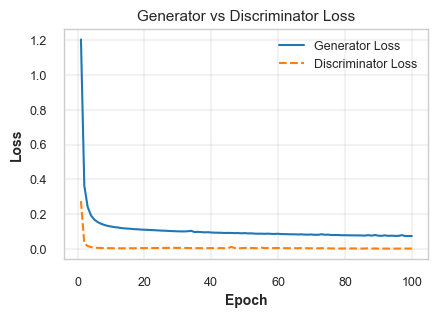

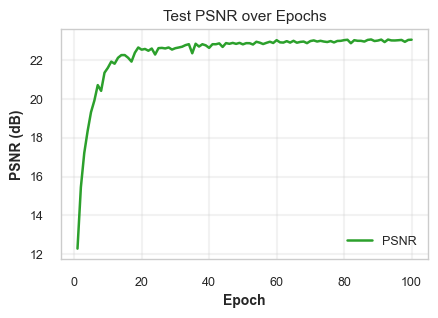

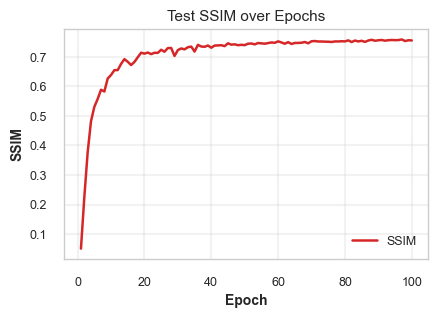

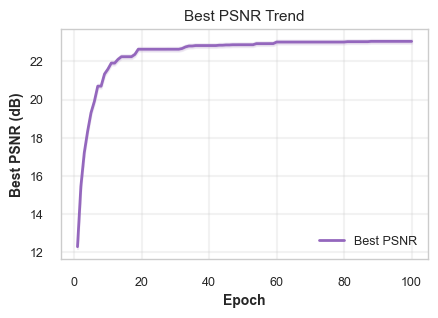

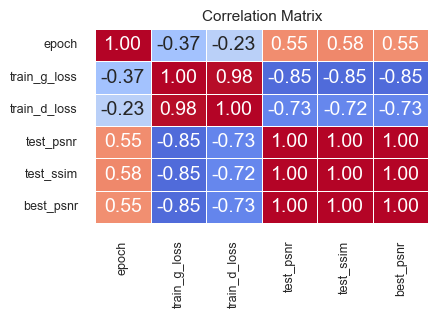

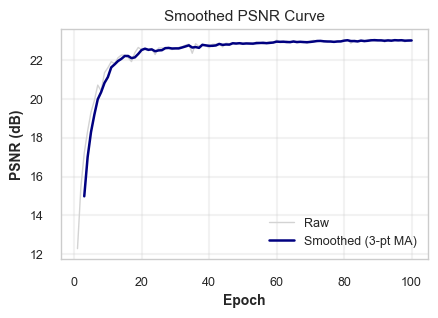

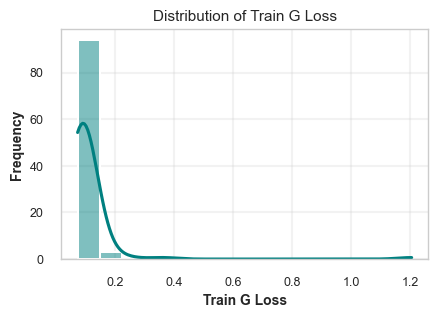

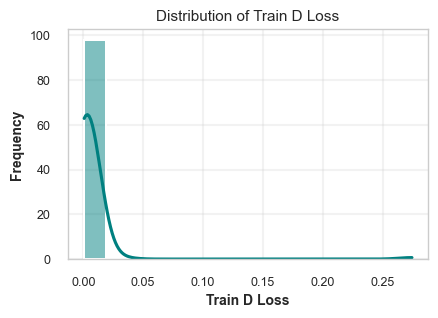

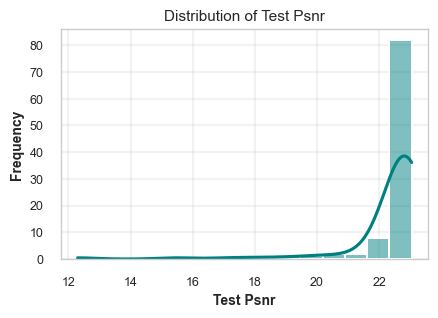

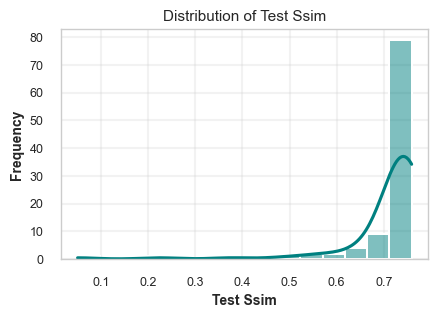


✅ All single-column research-grade plots saved successfully!


In [7]:
# ==============================================
# One-Column Research Paper Plots for GAN Metrics
# ==============================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams

# Load training log
df = pd.read_csv("training_log.csv")

# ==============================================
# ✨ Global Style Settings (Single-Column Format)
# ==============================================
rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman"],
    "axes.labelsize": 10,
    "axes.titlesize": 11,
    "legend.fontsize": 9,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "axes.linewidth": 1.0,
    "grid.alpha": 0.25,
    "grid.linestyle": "--",
    "savefig.dpi": 600,
    "figure.figsize": (4.3, 3.1),  # Ideal for one-column insertion
})
sns.set_style("whitegrid")
sns.set_palette("muted")

# ========== 1️⃣ Generator vs Discriminator Loss ==========
plt.figure()
plt.plot(df['epoch'], df['train_g_loss'], color="#1f77b4", linewidth=1.5, label="Generator Loss")
plt.plot(df['epoch'], df['train_d_loss'], color="#ff7f0e", linewidth=1.5, linestyle="--", label="Discriminator Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Generator vs Discriminator Loss")
plt.legend(frameon=False, loc="upper right")
plt.tight_layout(pad=0.3)
plt.savefig("col1_gan_loss_curve.png", bbox_inches='tight')
plt.show()

# ========== 2️⃣ PSNR Curve ==========
plt.figure()
plt.plot(df['epoch'], df['test_psnr'], color="#2ca02c", linewidth=1.8, label="PSNR")
plt.xlabel("Epoch")
plt.ylabel("PSNR (dB)")
plt.title("Test PSNR over Epochs")
plt.legend(frameon=False)
plt.tight_layout(pad=0.3)
plt.savefig("col2_psnr_curve.png", bbox_inches='tight')
plt.show()

# ========== 3️⃣ SSIM Curve ==========
plt.figure()
plt.plot(df['epoch'], df['test_ssim'], color="#d62728", linewidth=1.8, label="SSIM")
plt.xlabel("Epoch")
plt.ylabel("SSIM")
plt.title("Test SSIM over Epochs")
plt.legend(frameon=False)
plt.tight_layout(pad=0.3)
plt.savefig("col3_ssim_curve.png", bbox_inches='tight')
plt.show()

# ========== 4️⃣ Best PSNR Trend ==========
plt.figure()
plt.plot(df['epoch'], df['best_psnr'], color="#9467bd", linewidth=2, label="Best PSNR")
plt.fill_between(df['epoch'], df['best_psnr'] - 0.1, df['best_psnr'] + 0.1, color="#c5b0d5", alpha=0.25)
plt.xlabel("Epoch")
plt.ylabel("Best PSNR (dB)")
plt.title("Best PSNR Trend")
plt.legend(frameon=False)
plt.tight_layout(pad=0.3)
plt.savefig("col4_best_psnr.png", bbox_inches='tight')
plt.show()

# ========== 5️⃣ Correlation Heatmap ==========
plt.figure(figsize=(4.3, 3.1))
corr = df.corr(numeric_only=True)
sns.heatmap(corr, cmap='coolwarm', center=0, annot=True, fmt=".2f", linewidths=.5, cbar=False)
plt.title("Correlation Matrix")
plt.tight_layout(pad=0.3)
plt.savefig("col5_corr_heatmap.png", bbox_inches='tight')
plt.show()

# ========== 6️⃣ Smoothed PSNR Curve ==========
plt.figure()
window = 3
plt.plot(df['epoch'], df['test_psnr'], color='lightgray', linewidth=1.0, label="Raw")
plt.plot(df['epoch'], df['test_psnr'].rolling(window).mean(), color='navy', linewidth=1.8, label=f"Smoothed ({window}-pt MA)")
plt.xlabel("Epoch")
plt.ylabel("PSNR (dB)")
plt.title("Smoothed PSNR Curve")
plt.legend(frameon=False)
plt.tight_layout(pad=0.3)
plt.savefig("col6_smooth_psnr.png", bbox_inches='tight')
plt.show()

# ========== 7️⃣ Metric Distributions ==========
metrics = ['train_g_loss', 'train_d_loss', 'test_psnr', 'test_ssim']
for col in metrics:
    plt.figure()
    sns.histplot(df[col], kde=True, color='teal', bins=15)
    plt.xlabel(col.replace('_', ' ').title())
    plt.ylabel("Frequency")
    plt.title(f"Distribution of {col.replace('_', ' ').title()}")
    plt.tight_layout(pad=0.3)
    plt.savefig(f"col7_dist_{col}.png", bbox_inches='tight')
    plt.show()

print("\n✅ All single-column research-grade plots saved successfully!")


In [32]:
gen = EnhancedGenerator().to("cuda")  
disc = MultiScaleDiscriminator().to("cuda")

In [13]:
from torchsummary import summary
import torch

# Move components to device
device = "cuda" if torch.cuda.is_available() else "cpu"

gen = EnhancedGenerator().to(device)
disc = MultiScaleDiscriminator().to(device)
deform = DeformableBlock(64, 128).to(device)
resi = ResidualBlock(256).to(device)
attnt = AttentionModule(256).to(device)

# Summaries
print("\n--- Generator Summary ---")
summary(gen, (4, 256, 256))

print("\n--- Discriminator Summary ---")
summary(disc, (3, 256, 256))

print("\n--- Deformable Block Summary ---")
summary(deform, (64, 128, 128))

print("\n--- Residual Block Summary ---")
summary(resi, (256, 64, 64))

print("\n--- Attention Module Summary ---")
summary(attnt, (256, 64, 64))



--- Generator Summary ---
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           4,160
            Conv2d-2         [-1, 18, 128, 128]          10,386
      DeformConv2d-3        [-1, 128, 128, 128]          73,856
         GroupNorm-4        [-1, 128, 128, 128]             256
         LeakyReLU-5        [-1, 128, 128, 128]               0
   DeformableBlock-6        [-1, 128, 128, 128]               0
            Conv2d-7          [-1, 256, 64, 64]         524,544
            Conv2d-8          [-1, 256, 64, 64]         590,080
         GroupNorm-9          [-1, 256, 64, 64]             512
           Conv2d-10          [-1, 256, 64, 64]         590,080
        GroupNorm-11          [-1, 256, 64, 64]             512
    ResidualBlock-12          [-1, 256, 64, 64]               0
           Conv2d-13          [-1, 256, 64, 64]         590,080
        Grou